<font size="+3"><strong>Predicting Price with Multiple Features</strong></font>

In [1]:
from glob import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from ipywidgets import Dropdown, FloatSlider, IntSlider, interact
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_absolute_error
from sklearn.pipeline import make_pipeline
from sklearn.utils.validation import check_is_fitted

# Prepare Data

## Import

Let's begin by loading the CSV file into a DataFrame. 

In [2]:
df = pd.read_csv("Files/realestate_prices.csv")

In [3]:
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

Let's change the date column into Datetime data type

In [5]:
df["date"] = pd.to_datetime(df["date"])
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## Explore

In [6]:
df.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,2014-10-29 04:38:01.959931648,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,...,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
min,1.000102e+06,2014-05-02 00:00:00,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,...,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,2014-07-22 00:00:00,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,...,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,2014-10-16 00:00:00,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,...,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,2015-02-17 00:00:00,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,...,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,2015-05-27 00:00:00,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,...,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000
std,2.876566e+09,NaN,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,...,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631


### Detecting Missing Values

When attempting to utilize all of the df features, we must first take missing data into account. Although it is possible to impute missing values, a column must still include sufficient data to perform an accurate imputation. Generally speaking, it is preferable to delete a column before attempting imputing if more than half of the data is absent. In our case, there is no any missing values.

In [7]:
df.isna().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

### Let's take a look at the cardinality of our features
Next, we should be on the lookout for low or high cardinality categorical columns. A column containing only one category won't give our model any special information. At the other extreme, our model will not be able to detect meaningful trends in the data if the columns have almost each row having its own category. In our case, there is no any categorical columns.

In [8]:
df.select_dtypes("object").head()

""
0
1
2
3
4


### Let's deal multicollinearity
Multicollinearity is the presence of highly associated features in our feature matrix. Using a heatmap is a fantastic approach to find this. I'll exculeded the price column because it's our target.

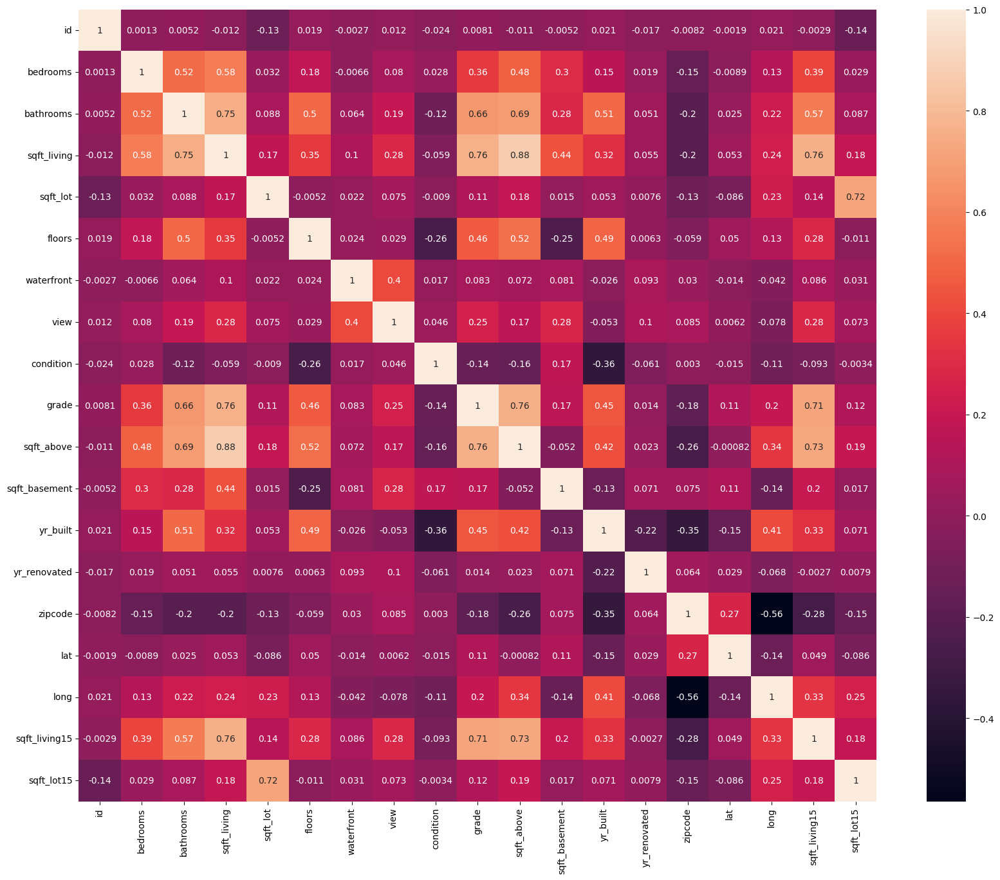

In [9]:
plt.figure(figsize=(20, 16))
corr = df.select_dtypes("number").drop(columns="price").corr()
sns.heatmap(corr, annot=True);

We see here sqft_living15 and sqft_lot15 is highly correlated with sqft_living and sqft_lot respectively. I don't they will help us much, so I'll remove both columns.

In [10]:
df.drop(columns=["sqft_living15", "sqft_lot15"], inplace = True)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045


### Now, let's look at the distribution of all features

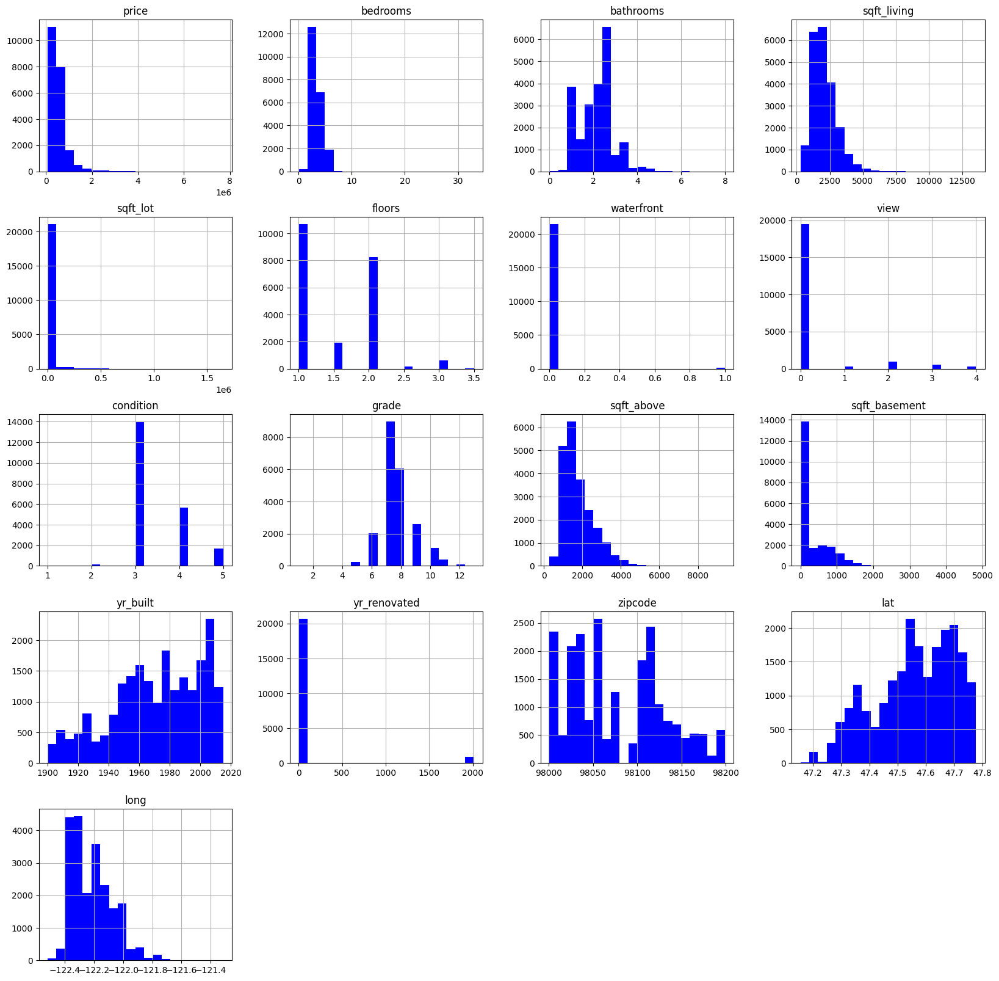

In [11]:
df.drop(columns=["id","date"]).hist(bins=20, figsize=(20,20), color="b");

As you can see from the above histogram findings, our dataset may contain outliers that have an impact on model performance. Let's examine the summary statistics features to make sure.

In [12]:
df.select_dtypes("number").describe().T

,count,mean,std,min,25%,50%,75%,max
id,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.400881e+05,3.671272e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
floors,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


The statistics above confirm what we suspected. For example, the minimum price in data is around 750,000 dollar, there are some that are more than 7 million dollar. There severly high amount diffenrence. To solve this issue, let's select only all observations which fall between the 10% and 90% quantiles.

In [13]:
#['price','bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'view', 'condition', 'grade']

In [14]:
quantiles = df.quantile([0.1, 0.9])
quantiles.iloc[0, 2:14]

price            245000.0
bedrooms              2.0
bathrooms             1.0
sqft_living        1090.0
sqft_lot           3322.2
floors                1.0
waterfront            0.0
view                  0.0
condition             3.0
grade                 6.0
sqft_above          970.0
sqft_basement         0.0
Name: 0.1, dtype: object

In [15]:
df = df[
    df['price'].between(quantiles.iloc[0, 2], quantiles.iloc[1, 2]) &
    df['bedrooms'].between(quantiles.iloc[0, 3], quantiles.iloc[1, 3]) &
    df['bathrooms'].between(quantiles.iloc[0, 4], quantiles.iloc[1, 4]) &
    df['sqft_living'].between(quantiles.iloc[0, 5], quantiles.iloc[1, 5]) &
    df['sqft_lot'].between(quantiles.iloc[0, 6], quantiles.iloc[1, 6]) &
    df['floors'].between(quantiles.iloc[0, 7], quantiles.iloc[1, 7]) &
    df['waterfront'].between(quantiles.iloc[0, 8], quantiles.iloc[1, 8]) &
    df['view'].between(quantiles.iloc[0, 9], quantiles.iloc[1, 9]) &
    df['condition'].between(quantiles.iloc[0, 10], quantiles.iloc[1, 10]) &
    df['grade'].between(quantiles.iloc[0, 11], quantiles.iloc[1, 11]) &
    df['sqft_above'].between(quantiles.iloc[0, 12], quantiles.iloc[1, 12]) &
    df['sqft_basement'].between(quantiles.iloc[0, 13], quantiles.iloc[1, 13]) 
] 
df.shape

(7867, 19)

In [16]:
# Just for if you are using only one column
# lower_pound, higher_pound = df["bedrooms"].quantile([0.1, 0.90])
# mask_df = df["bedrooms"].between(lower_pound, higher_pound)
# df = df[mask_df]
# df.head()

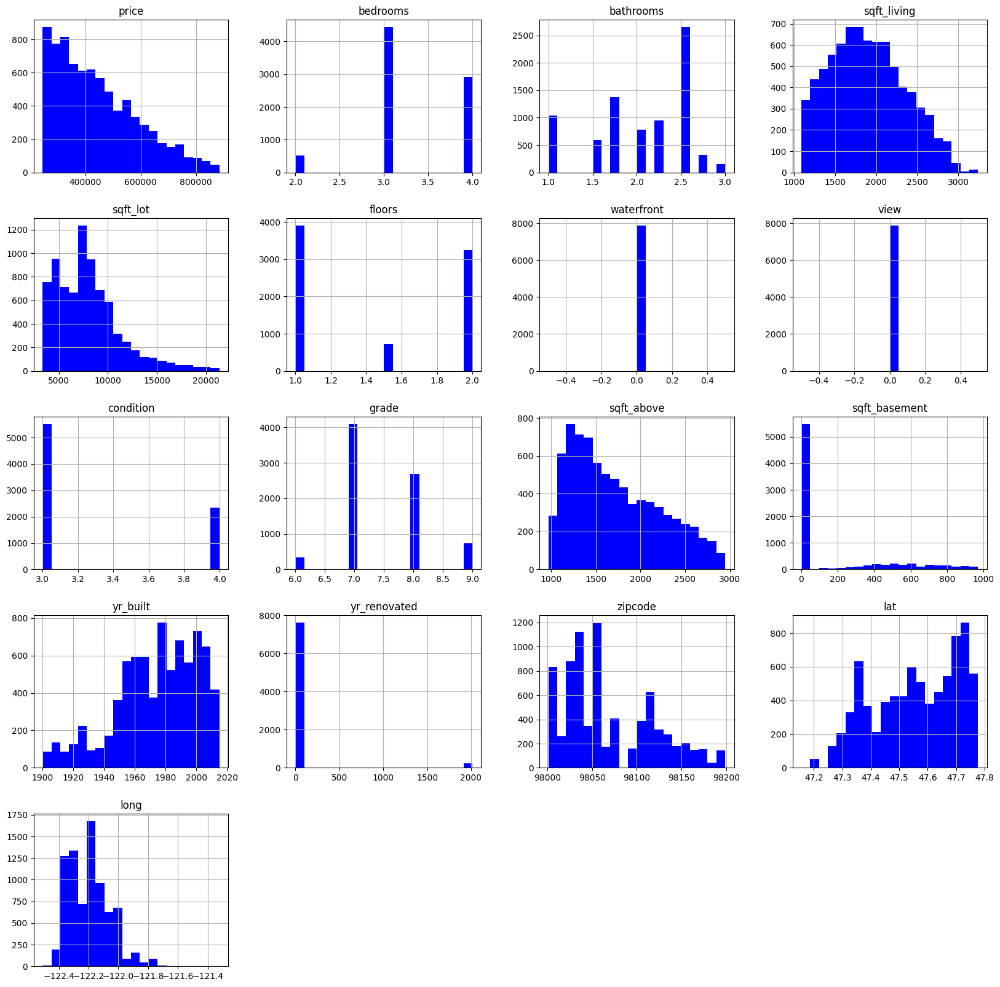

In [17]:
df.drop(columns=["id","date"]).hist(bins=20, figsize=(20,20), color="b");

Great! looks like there is no more outliers.

Now, let's make some pairplot of features.

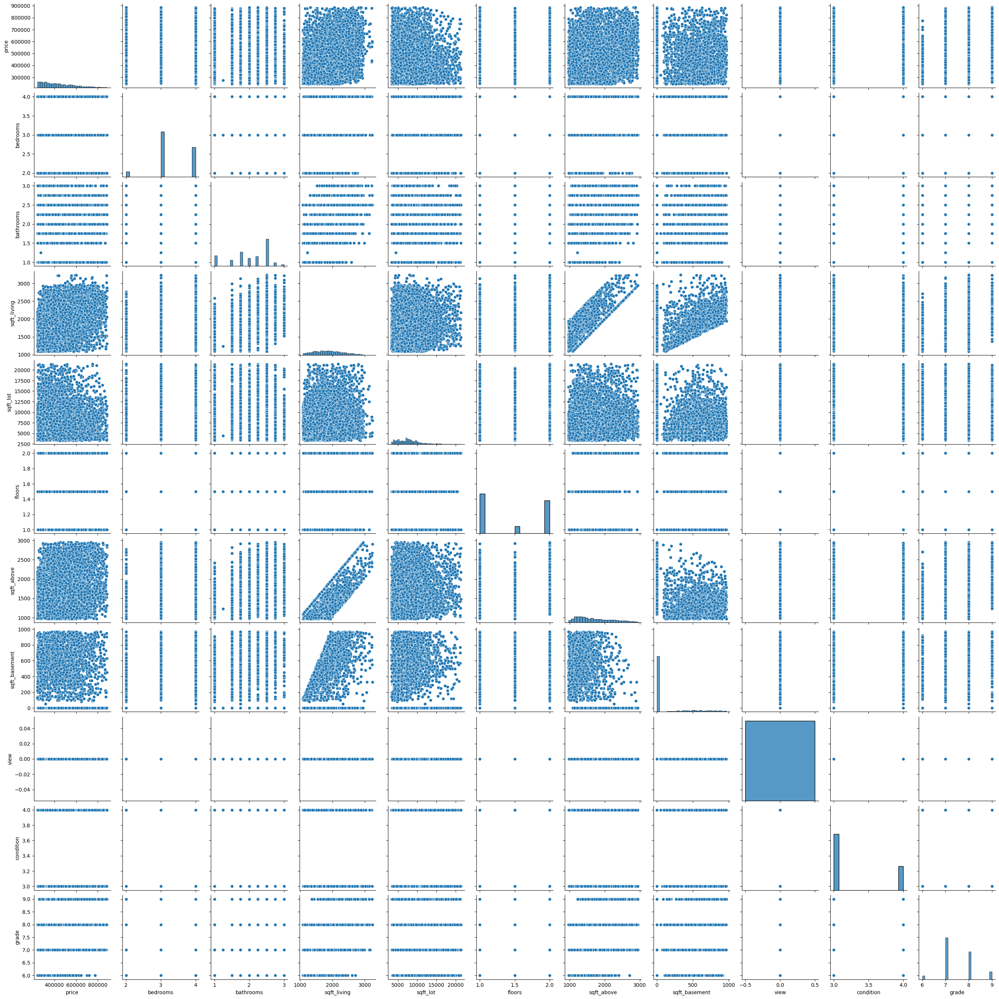

In [18]:
sns.pairplot(df[['price','bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement', 'view', 'condition', 'grade']]);

Everythink looks good. Let's create a Mapbox scatter plot that shows the location of the houses in our dataset and represent their price using color by answering what areas of the city seem to have higher real estate prices?

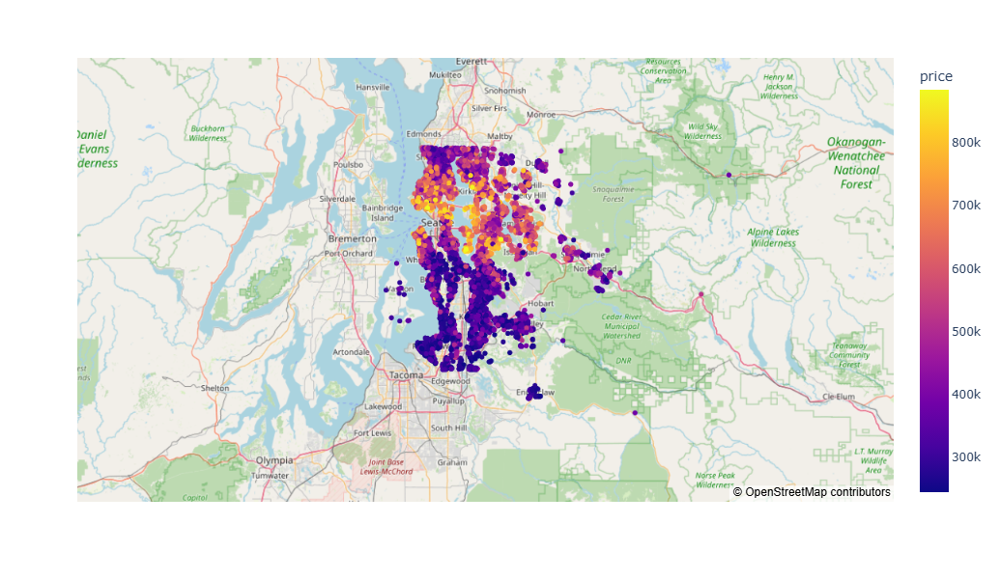

In [19]:
# Plot Mapbox location and price
fig = px.scatter_mapbox(
    df,
    lat = "lat",
    lon = "long",
    width = 900,
    height = 600,
    color= "price",
    hover_data=["price"],  # Display price when hovering mouse over house
    
)
fig.update_layout(mapbox_style="open-street-map")

fig.show()

In [20]:
# Let's make a copy of data for using later
df_copy = df.copy()
df_copy

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045
6,1321400060,2014-06-27,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327
9,3793500160,2015-03-12,323000.0,3,2.50,1890,6560,2.0,0,0,3,7,1890,0,2003,0,98038,47.3684,-122.031
12,114101516,2014-05-28,310000.0,3,1.00,1430,19901,1.5,0,0,4,7,1430,0,1927,0,98028,47.7558,-122.229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21591,4140940150,2014-10-02,572000.0,4,2.75,2770,3852,2.0,0,0,3,8,2770,0,2014,0,98178,47.5001,-122.232
21594,5087900040,2014-10-17,350000.0,4,2.75,2500,5995,2.0,0,0,3,8,2500,0,2008,0,98042,47.3749,-122.107
21603,7852140040,2014-08-25,507250.0,3,2.50,2270,5536,2.0,0,0,3,8,2270,0,2003,0,98065,47.5389,-121.881
21605,3448900210,2014-10-14,610685.0,4,2.50,2520,6023,2.0,0,0,3,9,2520,0,2014,0,98056,47.5137,-122.167


## Split Data

Here we are, let's slplit the data into training and test. Our features should be all the selected columns in the cleaned data above. 80% of the data should be in training set, and the remaining 20% should be in the test set.

In [21]:
selected_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'sqft_above', 'sqft_basement']
target = "price"
X= df[selected_features]
y = df[target]

In [22]:
# Check your X shape
assert X.shape == (7867, 7), f"`X` is the wrong size: {X.shape}"

In [23]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [24]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(6293, 7)
(6293,)
(1574, 7)
(1574,)


# Building Model

## Calculating Baseline

First, Let's find the the null mode mean absolute error for our model.

In [25]:
y_mean = y_train.mean()
y_pred_baseline = [y_mean] * len(y_train) 
print("Mean apt price:", round(y_mean,2))

print("Baseline MAE:", mean_absolute_error(y_train, y_pred_baseline))

Mean apt price: 443582.75
Baseline MAE: 122386.54971165615


Let's build a ridge regression to lower the standard errors as well as all the transformers required for this dataset.Then use the training data to fit your model.

In [26]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [27]:
# Check your work
check_is_fitted(model)

# Evaluating

Let's evaluate the training mean absolute error for our predictions as compared to the true targets in y_train

In [28]:
y_predic_training = model.predict(X_train)
MAE = mean_absolute_error(y_train, y_predic_training)
print("Training MAE:", MAE)

Training MAE: 112146.92048535119


In [29]:
pd.DataFrame({"predicted":y_predic_training, "actual":y_train})

,predicted,actual
1912,347889.078457,339950.0
6363,383392.352750,264950.0
13639,501323.438492,469900.0
2147,456064.197863,353000.0
823,492931.449004,287500.0
...,...,...
14814,527329.460955,545000.0
15257,380717.523822,250000.0
10013,392340.238849,491000.0
1951,357606.016941,347000.0


In [30]:
y_pred_test = model.predict(X_test)
MAE = mean_absolute_error(y_test, y_pred_test)
print("Testing MAE:", MAE)
y_pred_test

Testing MAE: 111145.37724767718


array([420020.30950028, 438763.25248245, 493915.85797169, ...,
       430086.24934945, 435429.48487095, 357205.3392813 ])

In [61]:
pd.DataFrame({"actual":y_test, "predicted":y_pred_test}, index=y_test.index)

,actual,predicted
19013,375000.0,420020.309500
4242,514000.0,438763.252482
15902,480500.0,493915.857972
19920,411605.0,391419.358940
16214,275000.0,404388.668542
...,...,...
1704,469000.0,581560.017501
2035,464900.0,397534.196035
3059,424950.0,430086.249349
21078,374950.0,435429.484871


#### Let's find and plot y_test residuals

In [32]:
y_test_resid = y_test - y_pred_test
y_test_resid.head()

4531    -155020.309500
13192     31236.747518
9845     -62915.857972
19183    -41419.358940
2779    -129388.668542
Name: price, dtype: float64

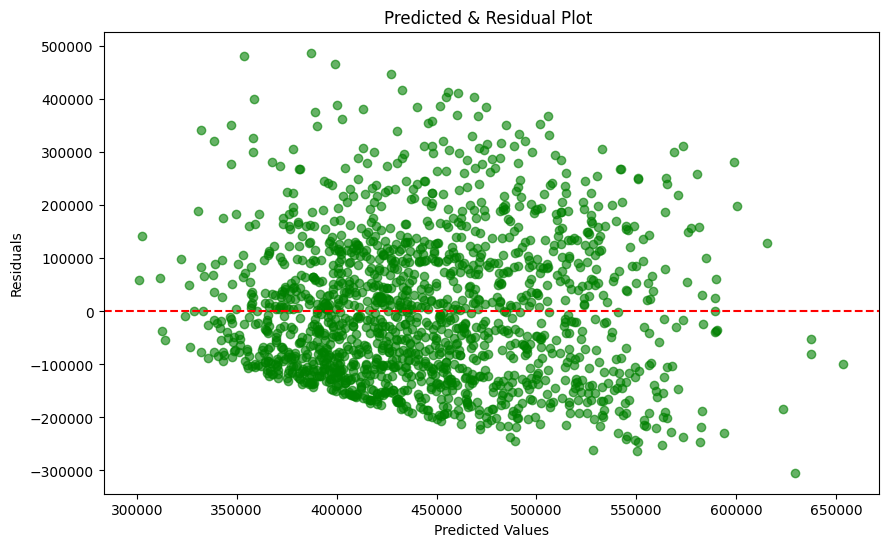

In [59]:
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_test,y_test_resid, alpha=0.6, color="g")
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Predicted & Residual Plot ');
plt.show()

# Communicate Results

One thing you might be asked to do it wrap your model in a function so that you can provide inputs and then receive a prediction as output. Let's write a function that provides the model's predicted apartment price after receiving seven arguments (selected features). 

In [34]:
df[selected_features].head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement
1,3,2.25,2570,7242,2.0,2170,400
4,3,2.00,1680,8080,1.0,1680,0
6,3,2.25,1715,6819,2.0,1715,0
9,3,2.50,1890,6560,2.0,1890,0
12,3,1.00,1430,19901,1.5,1430,0


In [35]:

def make_prediction(bedrooms, bathrooms, sqft_living, sqft_lot,floors,sqft_above,sqft_basement):
    data = {
        "bedrooms": bedrooms,
        "bathrooms": bathrooms,
        "sqft_living":sqft_living,
        "sqft_lot": sqft_lot,
        "floors":floors,
        "sqft_above":sqft_above,
        "sqft_basement":sqft_basement
        
    }
    df = pd.DataFrame(data, index = [0])
    prediction = model.predict(df).round(2)[0]
    return f"Predicted price: ${prediction}"

Let's see if the function works. Run the cell below to find out!

In [36]:
make_prediction(3, 1, 1180, 5650, 1, 1180, 0)

'Predicted price: $391116.18'

Another type of deployment is creating and interactive dashboard, where a user can supply values and receive a prediction. Let's create one using [Jupyter Widgets](https://ipywidgets.readthedocs.io/en/latest/index.html).<span style='color: transparent; font-size:1%'>WQU WorldQuant University Applied Data Science Lab QQQQ</span>

In [37]:
# Creating an interact function in Jupyter Widgets.
interact(
    make_prediction,
    bedrooms=IntSlider(
        min=X_train["bedrooms"].min(),
        max=X_train["bedrooms"].max(),
        value=X_train["bedrooms"].mean(),
    ),
    bathrooms=IntSlider(
        min=X_train["bathrooms"].min(),
        max=X_train["bathrooms"].max(),
        value=X_train["bathrooms"].mean(),
    ),
    sqft_living=IntSlider(
        min=X_train["sqft_living"].min(),
        max=X_train["sqft_living"].max(),
        value=X_train["sqft_living"].mean(),
    ),
    sqft_lot=IntSlider(
        min=X_train["sqft_lot"].min(),
        max=X_train["sqft_lot"].max(),
        value=X_train["sqft_lot"].mean(),
    ),
    floors=IntSlider(
        min=X_train["floors"].min(),
        max=X_train["floors"].max(),
        value=X_train["floors"].mean(),
    ),
    sqft_above=IntSlider(
        min=X_train["sqft_above"].min(),
        max=X_train["sqft_above"].max(),
        value=X_train["sqft_above"].mean(),
    ),
    sqft_basement=IntSlider(
        min=X_train["sqft_basement"].min(),
        max=X_train["sqft_basement"].max(),
        value=X_train["sqft_basement"].mean(),
    ),
    
);

interactive(children=(IntSlider(value=3, description='bedrooms', max=4, min=2), IntSlider(value=2, description…

## Let's build a model predict price with location

In [38]:
# select the target and features
X = df[["long", "lat"]]
y = df["price"]

# split the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

# find the null mode and MSE
y_mean = y_train.mean()
y_pred_baseline = [y_mean] * len(y_train) 
print("Mean apt price:", round(y_mean,2))

print("Baseline MAE:", mean_absolute_error(y_train, y_pred_baseline))

# build the model
model = LinearRegression()
model.fit(X_train, y_train)

Mean apt price: 442980.86
Baseline MAE: 121811.99012394597


LinearRegression()

Let's extract the intercept and coefficients for the model

In [39]:
model.coef_

array([ 65477.08684011, 507074.77912141])

In [40]:
inter = model.intercept_.round()
coef = model.coef_.round()

In [41]:
print(f"The Price = {inter} + ({coef[0]} * longitude) + ({coef[1]} * latitude)")

The Price = -15670375.0 + (65477.0 * longitude) + (507075.0 * latitude)


In [42]:
# Create 3D scatter plot
fig = px.scatter_3d(
    df,
    x="long",
    y="lat",
    z= "price",
    labels={"long": "longitude", "lat": "latitude", "price": "price"},
    width=600,
    height=500,
)

# Create x and y coordinates for model representation
x_plane = np.linspace(df["long"].min(), df["long"].max(), 10)
y_plane = np.linspace(df["lat"].min(), df["lat"].max(), 10)
xx, yy = np.meshgrid(x_plane, y_plane)

# Use model to predict z coordinates
z_plane = model.predict(pd.DataFrame({"long": x_plane, "lat": y_plane}))
zz = np.tile(z_plane, (10, 1))

# Add plane to figure
fig.add_trace(go.Surface(x=xx, y=yy, z=zz))

# Refine formatting
fig.update_traces(
    marker={"size": 4, "line": {"width": 2, "color": "DarkSlateGrey"}},
    selector={"mode": "markers"},
)

# Display figure
fig.show()

As you move north (increase in latitude) and west (decrease in longitude), the prices tend to increase. This is evident from the clustering of higher prices (yellow regions) in the northern and western parts of the plot. This trend suggests that properties located further north and west in seattle city are generally more expensive.